**<center> <span style="color:#0F52BA;font-family:serif; font-size:32px;"> Machine failure Classification 📈</span> </center>**

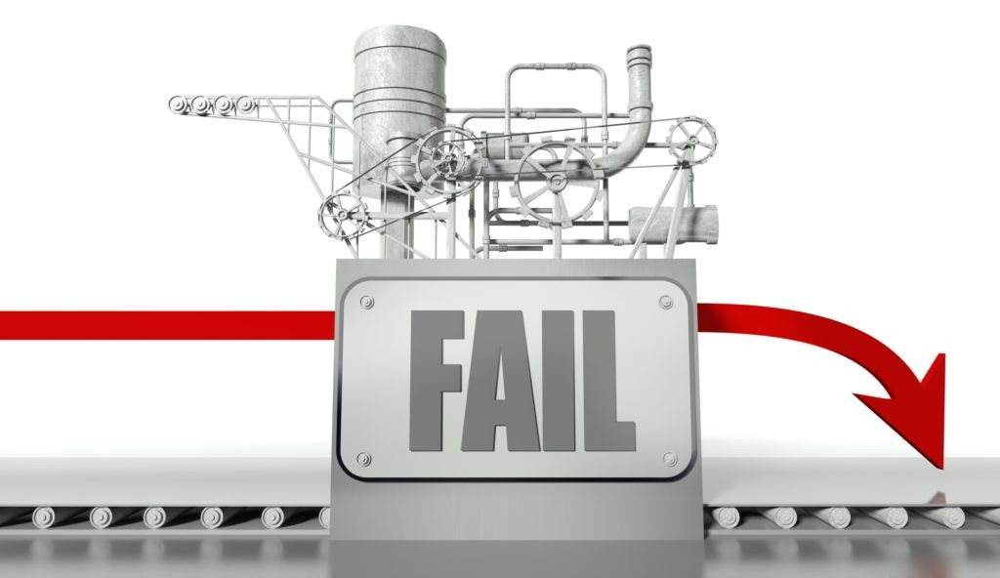

# <span style="font-family:serif; font-size:28px;"> Content</span>

1. [Introduction](#1)
    * [Columns Understanding](#2)
    
    
2. [Loading libraries and Data](#3)  





3. [Exploreing Data](#5)


4. [General Analysis](#6)




5. [Train vs Test](#7)


6. [Building Model and pipeline](#8)




<a id = "1" ></a>
# <span style="color:#0F52BA;font-family:serif;">1. Introduction </span>

<a id = "introduction" ></a>

<a id = "2" ></a>
# <span style="color:#0F52BA;font-family:serif;">  Columns Understanding </span>


Type: consisting of a letter L, M, or H for low, medium and high as product quality variants.

air temperature [K]: generated using a random walk process later normalized to a standard deviation of 2 K around 300 K.

process temperature [K]: generated using a random walk process normalized to a standard deviation of 1 K, added to the air temperature plus 10 K.

rotational speed [rpm]: calculated from a power of 2860 W, overlaid with a normally distributed noise.

torque [Nm]: torque values are normally distributed around 40 Nm with a Ïƒ = 10 Nm and no negative values.

tool wear [min]: The quality variants H/M/L add 5/3/2 minutes of tool wear to the used tool in the process.

machine failure: whether the machine has failed in this particular datapoint for any of the following failure modes are true.


The machine failure consists of five independent failure modes

tool wear failure (TWF): the tool will be replaced of fail at a randomly selected tool wear time between 200 ~ 240 mins.

heat dissipation failure (HDF): heat dissipation causes a process failure, if the difference between air and process temperature is below 8.6 K and the rotational speed is below 1380 rpm.

power failure (PWF): the product of torque and rotational speed (in rad/s) equals the power required for the process. If this power is below 3500 W or above 9000 W, the process fails.

overstrain failure (OSF): if the product of tool wear and torque exceeds 11,000 minNm for the L product variant (12,000 M, 13,000 H), the process fails due to overstrain.

random failures (RNF): each process has a chance of 0,1 % to fail regardless of its process parameters.

<a id = "3" ></a>
# <span style="font-family:serif; font-size:28px;"> 2. Loading libraries and Data</span>
 <a id="loading"></a>

In [169]:
#Analysis and Exploring Librarys...
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
import regex as re
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Model selection and metrics librarys 
from sklearn.model_selection import StratifiedKFold,cross_val_score,cross_val_predict,train_test_split,RandomizedSearchCV, GridSearchCV,learning_curve
from sklearn.metrics import precision_recall_curve,accuracy_score,confusion_matrix,ConfusionMatrixDisplay,mean_absolute_error,mean_squared_error,roc_auc_score,roc_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

from sklearn.preprocessing import OneHotEncoder
# Some Machine Learning Models
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import lightgbm as lgb  
from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,ExtraTreesClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from catboost import CatBoostClassifier
from catboost import Pool,CatBoostClassifier
from sklearn.model_selection import RepeatedKFold

In [170]:
train = pd.read_csv('train.csv') # import train
train

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0
3,3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0,0
4,4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136424,136424,M22284,M,300.1,311.4,1530,37.5,210,0,0,0,0,0,0
136425,136425,H38017,H,297.5,308.5,1447,49.1,2,0,0,0,0,0,0
136426,136426,L54690,L,300.5,311.8,1524,38.5,214,0,0,0,0,0,0
136427,136427,L53876,L,301.7,310.9,1447,46.3,42,0,0,0,0,0,0


In [171]:
print(f'The Shape of Train--> {train.shape}') # train shape(rows,col)

The Shape of Train--> (136429, 14)


In [172]:
test = pd.read_csv('test.csv') # test import 
test

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
0,136429,L50896,L,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,136430,L53866,L,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,136431,L50498,L,301.3,310.4,1525,37.7,96,0,0,0,0,0
3,136432,M21232,M,300.1,309.6,1479,47.6,5,0,0,0,0,0
4,136433,M19751,M,303.4,312.3,1515,41.3,114,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
90949,227378,L51130,L,302.3,311.4,1484,40.4,15,0,0,0,0,0
90950,227379,L47783,L,297.9,309.8,1542,33.8,31,0,0,0,0,0
90951,227380,L48097,L,295.6,306.2,1501,41.4,187,0,0,0,0,0
90952,227381,L48969,L,298.1,307.8,1534,40.3,69,0,0,0,0,0


In [173]:
print(f'The Shape of Test--> {test.shape}') # test shpae(rows,col)

The Shape of Test--> (90954, 13)


In [174]:
original = pd.read_csv('machine failure.csv') #Original dataframe import 
original

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0


In [175]:
print(f'The Shape of Original--> {original.shape}') #original shape(rows,col)

The Shape of Original--> (10000, 14)


In [176]:
df_train = pd.concat([train,original],axis = 0) #Concat Train df and Original df
df_train.drop(['id',"UDI"],axis = 1,inplace = True)

df_test = test.copy() # Make Copy from Test Data



In [177]:
# We Want To see the common rows between train and test data and assign Machine failure values in train data set
# to  common rows in test

common_rows = df_test.merge(df_train, how='inner').reset_index(drop = True) #1 common rows in test and train
common_rows # So we have 2611 common rows

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF,Machine failure
0,136449,L53941,L,301.7,310.9,1400,50.8,2,0,0,0,0,0,0
1,136662,L53271,L,300.9,310.7,1412,57.5,14,0,0,0,0,0,0
2,136662,L53271,L,300.9,310.7,1412,57.5,14,0,0,0,0,0,0
3,136662,L53271,L,300.9,310.7,1412,57.5,14,0,0,0,0,0,0
4,136662,L53271,L,300.9,310.7,1412,57.5,14,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2606,227102,L47897,L,297.4,308.7,1545,36.6,125,0,0,0,0,0,0
2607,227102,L47897,L,297.4,308.7,1545,36.6,125,0,0,0,0,0,0
2608,227102,L47897,L,297.4,308.7,1545,36.6,125,0,0,0,0,0,0
2609,227219,M17942,M,300.1,309.3,1407,43.9,138,0,0,0,0,0,0


In [178]:


df_test['Machine failure'] = np.nan # make new col in test data set


#assign Machine failure values in train data set to  common rows in test

for i in list(df_test.index): # iterate over test  index
    
    if df_test.loc[i,'id'] in list(common_rows['id']): # if the id in test is found in common rows ids list then..
        df_test.loc[i,'Machine failure'] = common_rows[common_rows['id'] == df_test.loc[i,'id']]['Machine failure'].values[0]
        #we assign the value to it
df_test

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF,Machine failure
0,136429,L50896,L,302.3,311.5,1499,38.0,60,0,0,0,0,0,NaN
1,136430,L53866,L,301.7,311.0,1713,28.8,17,0,0,0,0,0,NaN
2,136431,L50498,L,301.3,310.4,1525,37.7,96,0,0,0,0,0,NaN
3,136432,M21232,M,300.1,309.6,1479,47.6,5,0,0,0,0,0,NaN
4,136433,M19751,M,303.4,312.3,1515,41.3,114,0,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90949,227378,L51130,L,302.3,311.4,1484,40.4,15,0,0,0,0,0,NaN
90950,227379,L47783,L,297.9,309.8,1542,33.8,31,0,0,0,0,0,0.0
90951,227380,L48097,L,295.6,306.2,1501,41.4,187,0,0,0,0,0,NaN
90952,227381,L48969,L,298.1,307.8,1534,40.3,69,0,0,0,0,0,NaN


In [179]:
df_test['Machine failure'].value_counts() # So far good we have found some Values for Machine failures

0.0    1217
1.0      41
Name: Machine failure, dtype: int64

<a id = "5" ></a>
# <span style="font-family:serif; font-size:28px;"> 3. Exploreing Data  </span>
<a id = "missingvalue" ></a>



In [180]:
def info_df(df):
    nan_count = df.isna().sum() # Number of Null Values
    nan_perc= (nan_count / df.shape[0]) * 100 # Prec of Null Values
    dtype_df = df.dtypes # types for each col
    num_dup = df.apply(lambda x : x.duplicated().sum()) # Number of Duplicated in each col
    num_uni = df.apply(lambda x : len(x.unique())) # Number of unique values in each col
     
    info_data = pd.concat([nan_count,nan_perc,dtype_df,num_dup,num_uni],axis = 1).reset_index() #Now we concat all of them
    info_data.rename(columns = {0 : 'NaN Count' , 1:'Nan Perc',2:'Dtype',3:'num_dup',4:'num_uniq'},inplace= True) # just rename
    return info_data

In [181]:
info_df(df_train).style.background_gradient()

,index,NaN Count,Nan Perc,Dtype,num_dup,num_uniq
0,Product ID,0,0.000000,object,136429,10000
1,Type,0,0.000000,object,146426,3
2,Air temperature [K],0,0.000000,float64,146333,96
3,Process temperature [K],0,0.000000,float64,146347,82
4,Rotational speed [rpm],0,0.000000,int64,145472,957
5,Torque [Nm],0,0.000000,float64,145814,615
6,Tool wear [min],0,0.000000,int64,146183,246
7,Machine failure,0,0.000000,int64,146427,2
8,TWF,0,0.000000,int64,146427,2
9,HDF,0,0.000000,int64,146427,2


In [182]:
print(f"Number of Rows Duplicate in Train {df_train.duplicated().sum()}")

Number of Rows Duplicate in Train 1134


In [183]:
df_train[df_train['Machine failure'] == 0].duplicated().sum() # Number of Duplicated Rows only for MF == 0

1115

In [184]:
df_train = df_train[~(df_train['Machine failure'] == 0) | ~(df_train.duplicated())] # I want to only dropDup for MF == 0 rows because we have already a small number of value=1

df_train

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0
3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0,0
4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0
9996,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0
9997,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0
9998,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0


In [185]:
info_df(df_test).style.background_gradient()

,index,NaN Count,Nan Perc,Dtype,num_dup,num_uniq
0,id,0,0.000000,int64,0,90954
1,Product ID,0,0.000000,object,81045,9909
2,Type,0,0.000000,object,90951,3
3,Air temperature [K],0,0.000000,float64,90862,92
4,Process temperature [K],0,0.000000,float64,90870,84
5,Rotational speed [rpm],0,0.000000,int64,90008,946
6,Torque [Nm],0,0.000000,float64,90359,595
7,Tool wear [min],0,0.000000,int64,90708,246
8,TWF,0,0.000000,int64,90952,2
9,HDF,0,0.000000,int64,90952,2


In [186]:
# Some statistical Info
print(50 * '#')
print(f'info {df_train.info()}')
print(50 * '#')
df_train.describe().style.background_gradient()


##################################################

<class 'pandas.core.frame.DataFrame'>

Int64Index: 145314 entries, 0 to 9999

Data columns (total 13 columns):

 #   Column                   Non-Null Count   Dtype  

---  ------                   --------------   -----  

 0   Product ID               145314 non-null  object 

 1   Type                     145314 non-null  object 

 2   Air temperature [K]      145314 non-null  float64

 3   Process temperature [K]  145314 non-null  float64

 4   Rotational speed [rpm]   145314 non-null  int64  

 5   Torque [Nm]              145314 non-null  float64

 6   Tool wear [min]          145314 non-null  int64  

 7   Machine failure          145314 non-null  int64  

 8   TWF                      145314 non-null  int64  

 9   HDF                      145314 non-null  int64  

 10  PWF                      145314 non-null  int64  

 11  OSF                      145314 non-null  int64  

 12  RNF                      145314 non-null  int64

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
count,145314.000000,145314.000000,145314.000000,145314.000000,145314.000000,145314.000000,145314.000000,145314.000000,145314.000000,145314.000000,145314.000000
mean,299.872858,309.945504,1521.608434,40.318173,104.617387,0.017115,0.001775,0.005629,0.002904,0.004384,0.002237
std,1.872755,1.392023,141.913262,8.604794,63.934301,0.129699,0.042099,0.074817,0.053811,0.066064,0.047239
min,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,298.300000,308.800000,1432.000000,34.600000,49.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,300.000000,310.000000,1494.000000,40.400000,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,301.200000,310.900000,1583.000000,46.100000,159.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [187]:

print(50 * '#')
print(f'info {df_test.info()}')
print(50 * '#')
df_test.describe().style.background_gradient()


##################################################

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 90954 entries, 0 to 90953

Data columns (total 14 columns):

 #   Column                   Non-Null Count  Dtype  

---  ------                   --------------  -----  

 0   id                       90954 non-null  int64  

 1   Product ID               90954 non-null  object 

 2   Type                     90954 non-null  object 

 3   Air temperature [K]      90954 non-null  float64

 4   Process temperature [K]  90954 non-null  float64

 5   Rotational speed [rpm]   90954 non-null  int64  

 6   Torque [Nm]              90954 non-null  float64

 7   Tool wear [min]          90954 non-null  int64  

 8   TWF                      90954 non-null  int64  

 9   HDF                      90954 non-null  int64  

 10  PWF                      90954 non-null  int64  

 11  OSF                      90954 non-null  int64  

 12  RNF                      90954 non-null  int64  

 13  Machin

,id,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF,Machine failure
count,90954.000000,90954.000000,90954.000000,90954.000000,90954.000000,90954.000000,90954.000000,90954.000000,90954.000000,90954.000000,90954.000000,1258.000000
mean,181905.500000,299.859493,309.939375,1520.528179,40.335191,104.293962,0.001473,0.005343,0.002353,0.003870,0.002309,0.032591
std,26256.302529,1.857562,1.385296,139.970419,8.504683,63.871092,0.038355,0.072903,0.048449,0.062090,0.047995,0.177635
min,136429.000000,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,159167.250000,298.300000,308.700000,1432.000000,34.600000,48.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,181905.500000,300.000000,310.000000,1493.000000,40.500000,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,204643.750000,301.200000,310.900000,1579.000000,46.200000,158.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,227382.000000,304.400000,313.800000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [188]:
num_feature = ['Air temperature [K]', 'Process temperature [K]',
       'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']

cat_feature = ['Product ID', 'Type','TWF', 'HDF', 'PWF', 'OSF', 'RNF']

In [189]:
def label_txt(txt,w = 0.4,h = 0.5,font_size = 40,facecolor = '#bde0fe'):
    fig = plt.figure(figsize=(22, 0.8))
    plt.axis('off')


    t = plt.text(w, h,
                txt,
                fontsize = font_size, 
                weight = 1000, 
                va ='center')
    fig.set_facecolor(facecolor)
    # hatch ='xxxx'
    t.set_path_effects([path_effects.PathPatchEffect(offset =(3, -4),
                                                   
                                                    facecolor ='gray'),
                        path_effects.PathPatchEffect(edgecolor ='white', 
                                                    linewidth = 1.1,
                                                    facecolor ='black')])

def cat_ana(col,df,target = None):
    sns.set_context('notebook',font_scale= 1.5)
    plt.rcParams['figure.facecolor'] = 'ghostwhite'
    plt.rcParams['axes.facecolor'] = 'white'
    fig, axs = plt.subplots(1,2,figsize = (25,10))

    g = sns.countplot(x = col,data = df ,order = df[col].value_counts().index,hue = target ,palette="crest", ax = axs[0])
    
    axs[0].set_title(f'Value_counts for {col}')
    g.bar_label(g.containers[0])
    
    plt.pie(df[col].value_counts().values , labels =df[col].value_counts().index 
            , shadow = True , autopct= '%1.1f%%', wedgeprops= {'edgecolor' : 'black'} )
    plt.grid()
    plt.tight_layout()
    plt.show()
    
def cat_count(col,df,target,title):
    plt.figure(figsize=(20,10))
    g = sns.countplot(y = col,data = df ,order = df[col].value_counts().index,hue = target ,palette="crest")
    
    g.set_title(title)
    g.legend(loc='lower right')
    for i in range(len(df_train['Type'].value_counts())):
        plt.bar_label(g.containers[i])

        
def hist_df(row,col,df,hue = None):


    fig, axes = plt.subplots(row,col,figsize = (25,10))

    nu_col = 0

    for i in range(row):
        for c in range(col):
            g = sns.histplot(x = num_feature[nu_col],data = df,hue  = hue ,ax = axes[i][c],kde=True)
            nu_col+=1
    plt.tight_layout()
    plt.show()

    
def scatter_df(x,y,df,hue = None,markers = None):
    plt.figure(figsize=(20,10))
    sns.scatterplot(x=  x,y = y,data = df,hue = hue ,style=hue)
    plt.title(f"{x} vs {y}")
    plt.tight_layout()
    plt.show()
    
def hist_box(x,df,hue = None):
    
    fig, axes = plt.subplots(1,2,figsize = (30,12))
    
    sns.histplot(x = x,data = df,hue  = hue ,ax = axes[0],kde=True)
    sns.boxplot(x = hue,y = x,data = df ,ax = axes[1])
    fig.suptitle(f"{x} col Dist")

In [190]:
df_train['Product_ID_num'] = df_train['Product ID'].str.replace('M','').str.replace('L','').str.replace('H','').astype(int)
df_test['Product_ID_num'] = df_test['Product ID'].str.replace('M','').str.replace('L','').str.replace('H','').astype(int)
# convert Product to Num(it may help soon...)


In [191]:
df_train

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF,Product_ID_num
0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0,50096
1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0,20343
2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0,49454
3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0,0,53355
4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0,0,24050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0,24855
9996,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0,39410
9997,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0,24857
9998,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0,39412


In [192]:
num_feature = ['Air temperature [K]', 'Process temperature [K]',
       'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']

cat_feature = ['Product ID', 'Type','TWF', 'HDF', 'PWF', 'OSF', 'RNF']

num_feature = num_feature + ['Product_ID_num']


<a id = "6" ></a>
# <span style="font-family:serif; font-size:28px;"> 4. General Analysis </span>
<a id = "6" ></a>

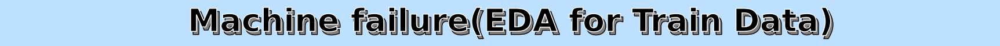

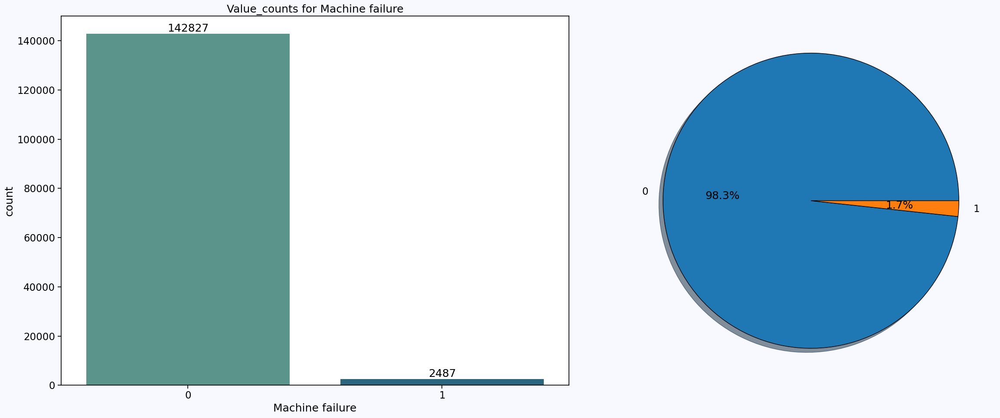

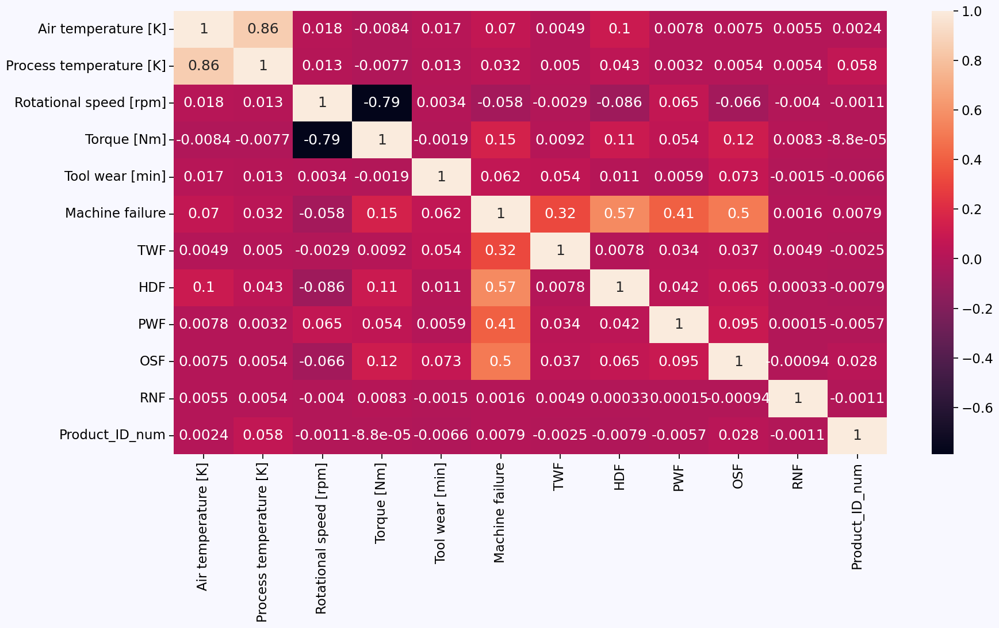

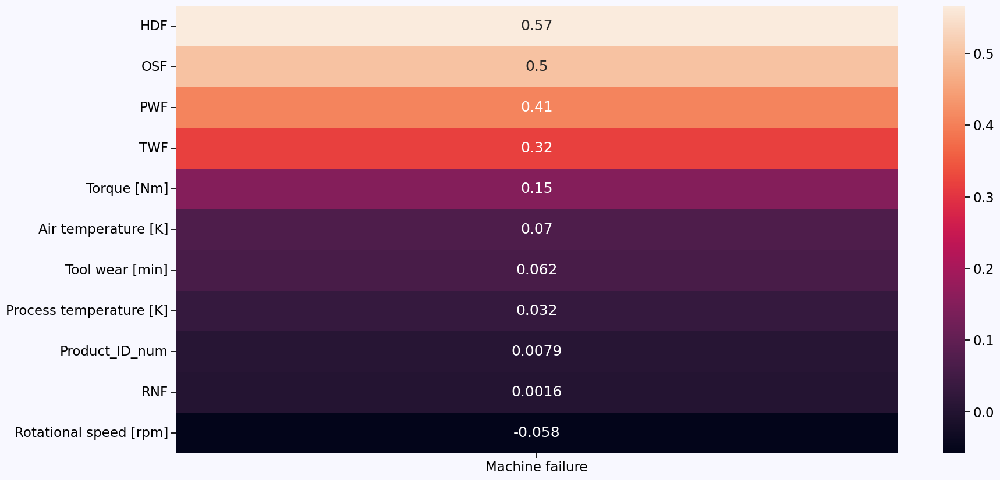

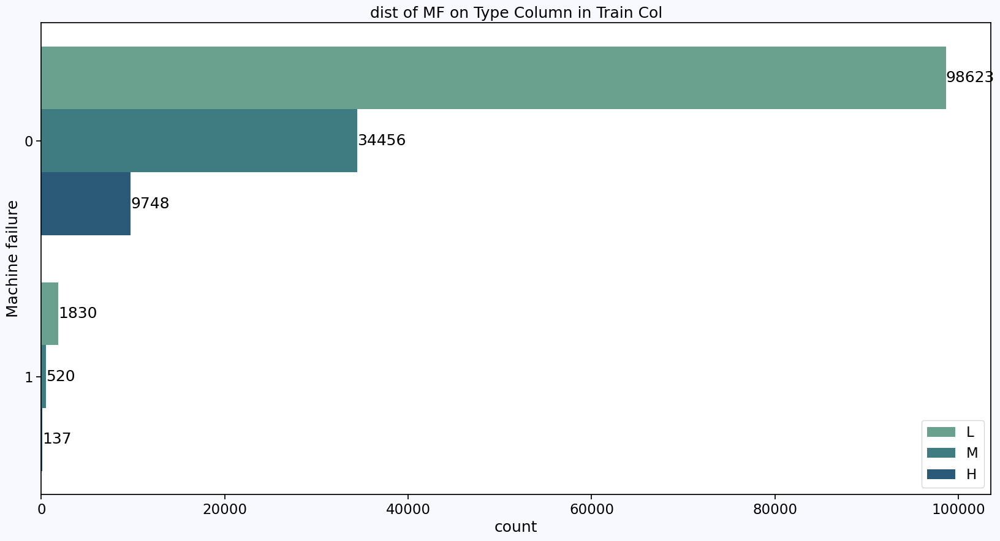

...

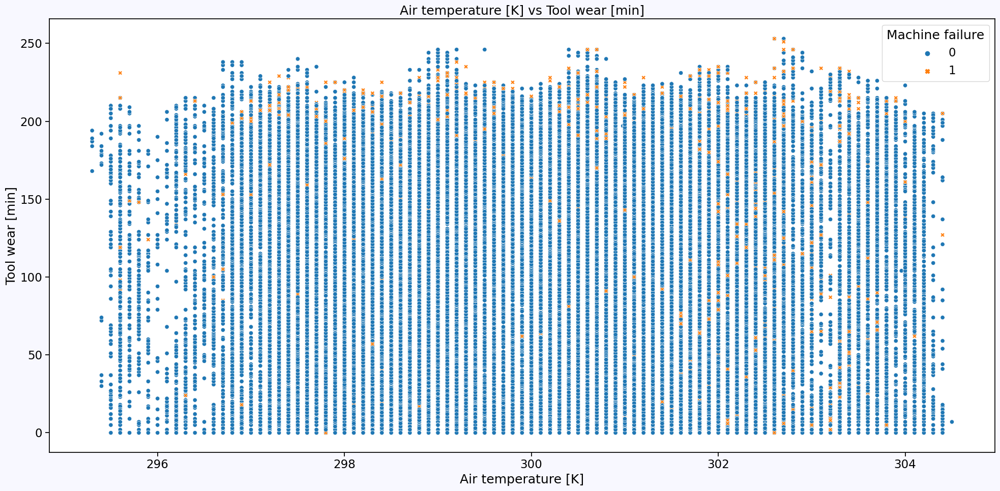

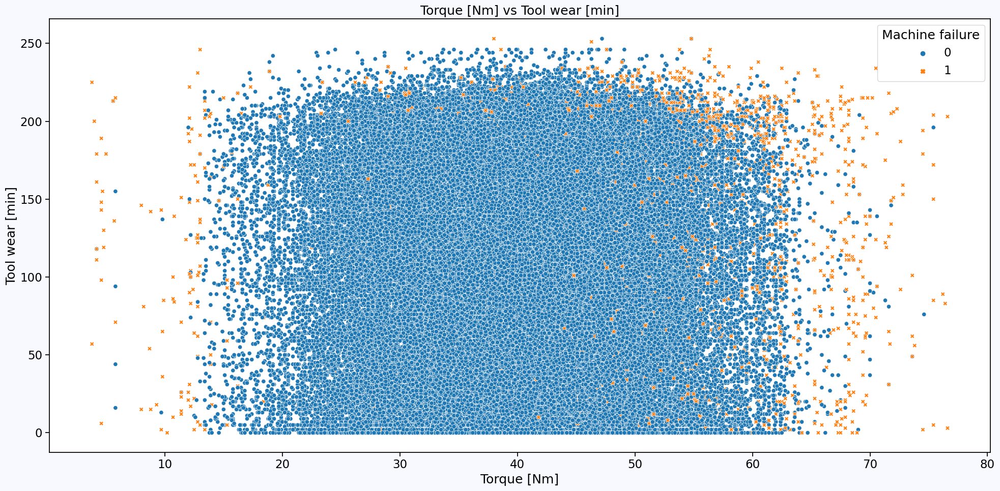

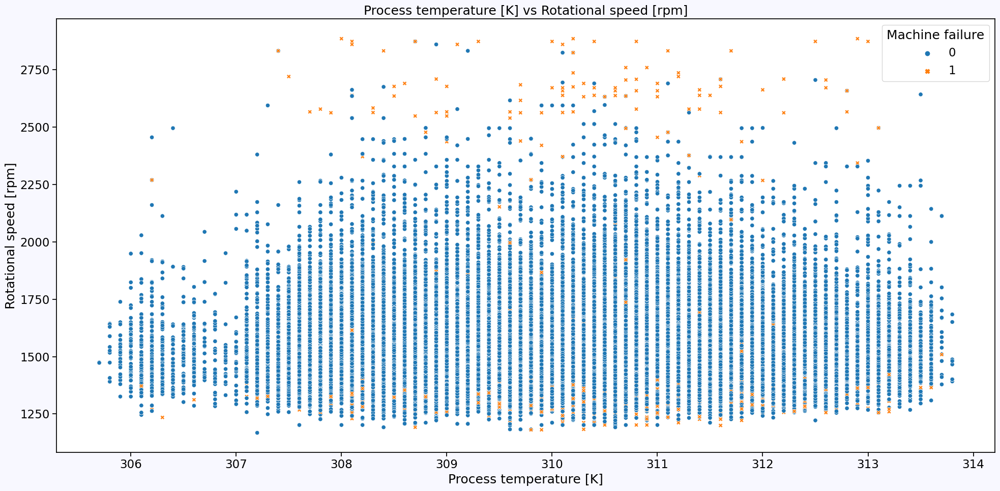

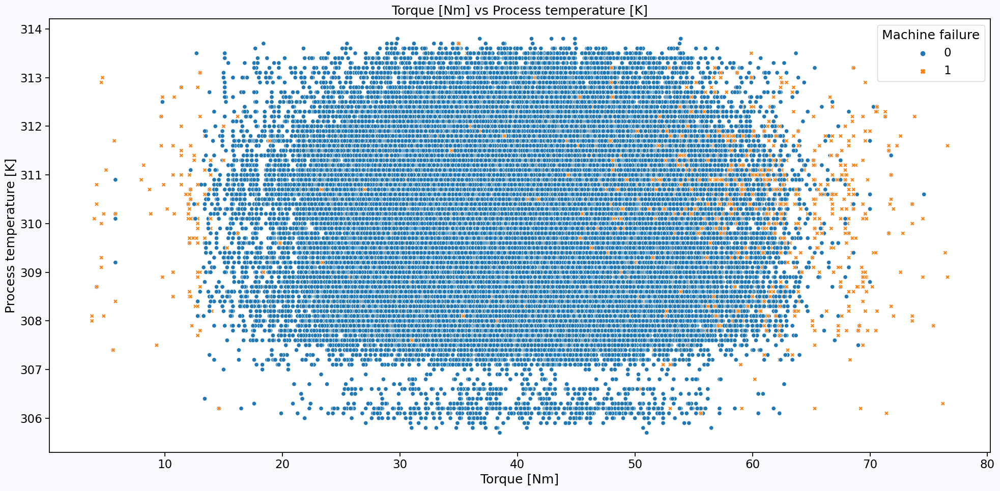

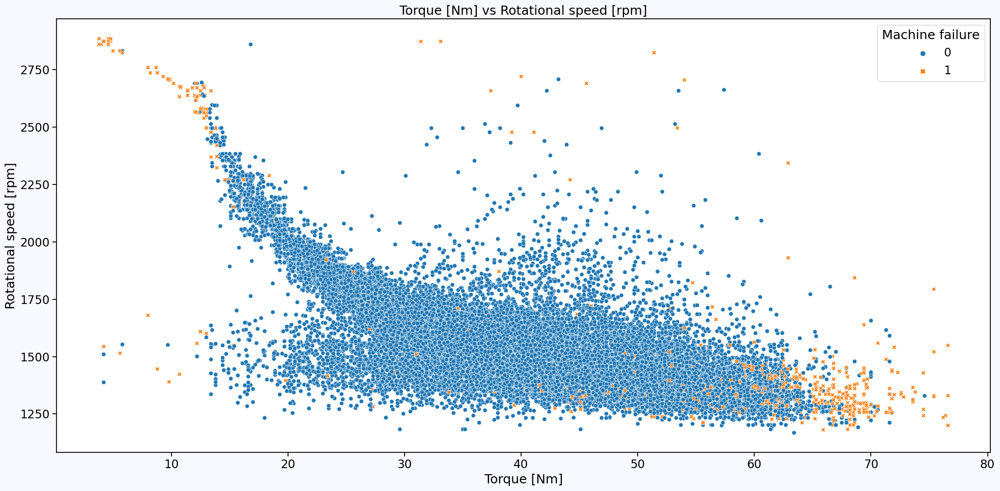

In [193]:
label_txt(f'   Machine failure(EDA for Train Data)',w = 0.15)

cat_ana('Machine failure',df_train)

plt.figure(figsize=(20,10))
sns.heatmap(df_train.corr(),annot = True)
plt.figure(figsize=(20,10))

sns.heatmap(df_train.corr()['Machine failure'].drop('Machine failure').sort_values(ascending=False).to_frame(),annot = True)
cat_count('Machine failure',df_train,'Type','dist of MF on Type Column in Train Col')

label_txt(f'                Dist for Num Col',w = 0.15)

#hist_df(3,2,df_train,"Machine failure")

for i in num_feature:
    
    if i == 'Product_ID_num':
        continue
    hist_box(i,df_train,'Machine failure')
    
scatter_df('Air temperature [K]','Process temperature [K]',df_train,hue = 'Machine failure')
scatter_df('Air temperature [K]','Rotational speed [rpm]',df_train,hue = 'Machine failure')

scatter_df('Air temperature [K]','Torque [Nm]',df_train,hue = 'Machine failure')
scatter_df('Air temperature [K]','Tool wear [min]',df_train,hue = 'Machine failure')

scatter_df('Torque [Nm]','Tool wear [min]',df_train,hue = 'Machine failure')
scatter_df('Process temperature [K]','Rotational speed [rpm]',df_train,hue = 'Machine failure')


scatter_df('Torque [Nm]','Process temperature [K]',df_train,hue = 'Machine failure')
scatter_df('Torque [Nm]','Rotational speed [rpm]',df_train,hue = 'Machine failure')



<a id = "7" ></a>
# <span style="font-family:serif; font-size:28px;"> 5.  Train vs Test </span>
<a id = "7" ></a>

In [194]:
def hist_df(row,col,df_tr,df_te):


    fig, axes = plt.subplots(row,col,figsize = (30,15))

    nu_col = 0
    fig.suptitle('Train vs Test Dist')
    for i in range(row):
        for c in range(col):
            sns.histplot(x = num_feature[nu_col],data = df_tr ,ax = axes[i][c],kde=True,label='Train')
            sns.histplot(x = num_feature[nu_col],data = df_te ,ax = axes[i][c],kde=True,label="Test")
            axes[i][c].legend()
            
            nu_col+=1
    plt.tight_layout()
    plt.show()
def stat_train_test(df_tr,df_te):
    fig, axs = plt.subplots(1,2,figsize = (25,10))

    fig.suptitle('Train Statitics vs Test Statitics')
    g = sns.heatmap(df_tr[num_feature].describe().transpose(), annot=True, cmap='YlOrBr', fmt=".0f", cbar=False,ax=axs[0])
    g.set_title('Train Statitics')
    g = sns.heatmap(df_te[num_feature].describe().transpose(), annot=True, cmap='YlOrBr', fmt=".0f", cbar=False,ax=axs[1])
    g.set_title('Test Statitics')

    plt.tight_layout()
    plt.show()
def stat_train_test_heat(df_tr,df_te):
    fig, axs = plt.subplots(1,2,figsize = (25,10))

    fig.suptitle('Train Statitics vs Test HeatMap')
    g = sns.heatmap(df_tr.corr(), annot=True, cmap='YlOrBr', fmt=".2f", cbar=False,ax=axs[0])
    g.set_title('Train HeatMap')
    g = sns.heatmap(df_te.drop('id',axis = 1).corr(), annot=True, cmap='YlOrBr', fmt=".2f", cbar=False,ax=axs[1])
    g.set_title('Test HeatMap')

    plt.tight_layout()
    plt.show()

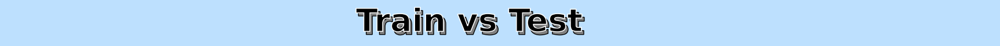

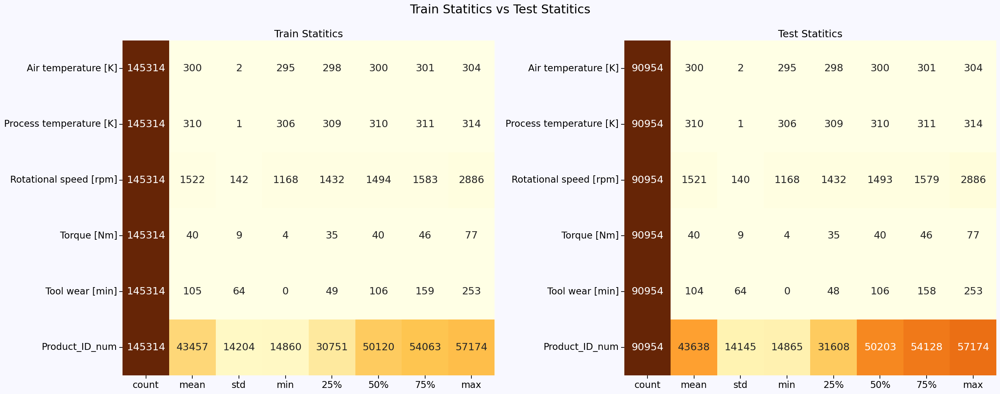

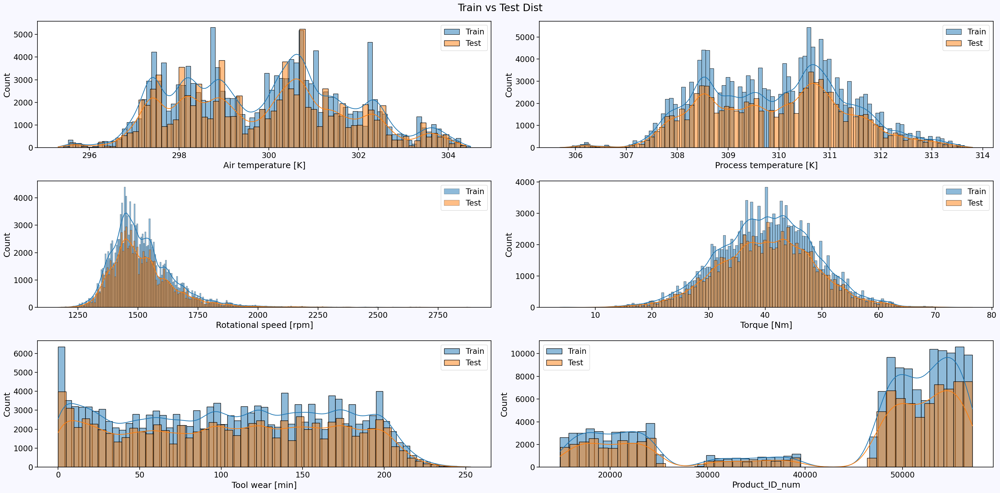

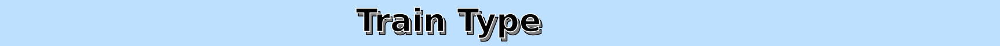

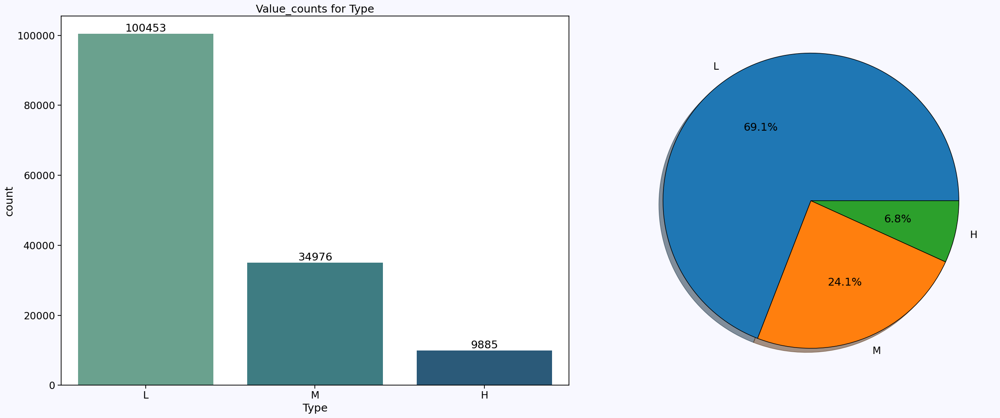

...

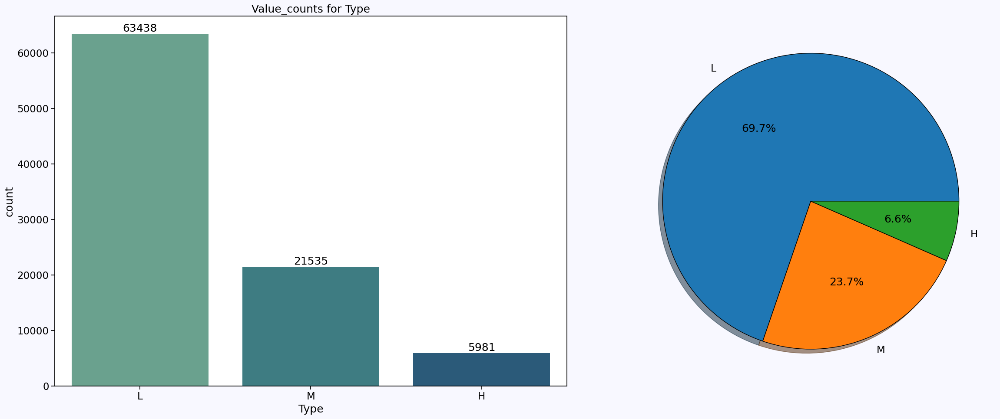

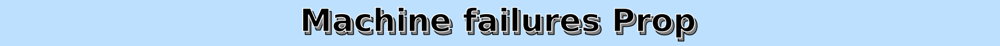

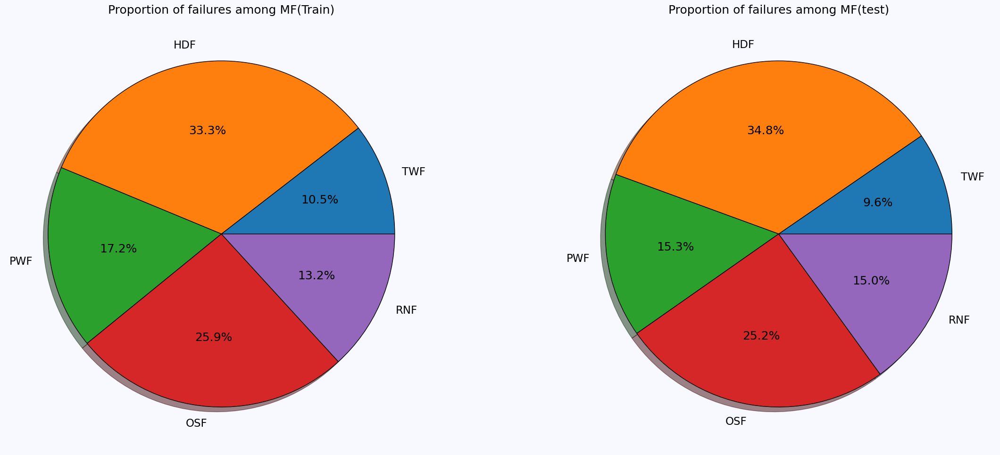

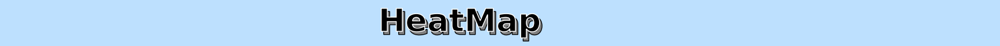

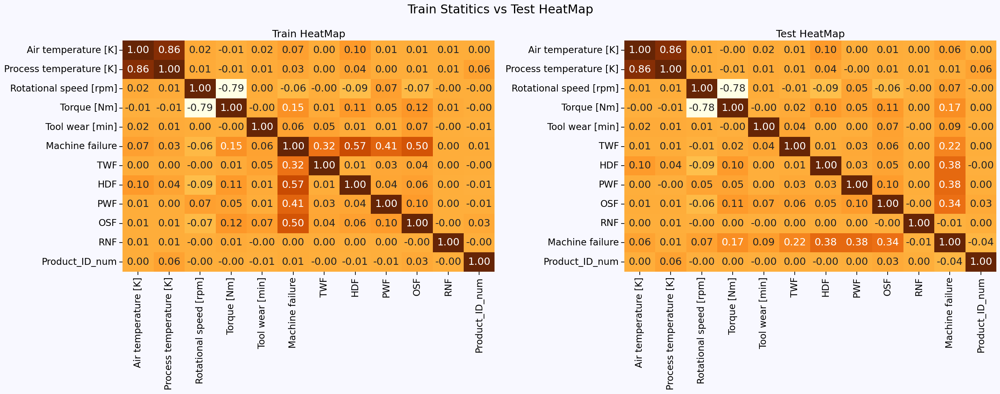

In [195]:
label_txt(f'                  Train vs Test',w = 0.15)
stat_train_test(df_train,df_test)
hist_df(3,2,df_train,df_test)

label_txt(f'                  Train Type',w = 0.15)
cat_ana('Type',df_train)

fig, axes = plt.subplots(1,2,figsize = (25,10))

axes[0].pie(df_train.groupby('Type')[['Machine failure']].aggregate('sum')['Machine failure'].values , labels =df_train.groupby('Type')[['Machine failure']].aggregate('sum')['Machine failure'].index 
            , shadow = True , autopct= '%1.1f%%', wedgeprops= {'edgecolor' : 'black'} )


axes[0].set_title('Machine failure count by Type')

sns.barplot(x = 'Type',y = 'Machine failure',data = df_train,estimator=np.mean,ci = None ,ax = axes[1])
axes[1].set_title('Machine failure Mean by Type')




label_txt(f'                  Test Type ',w = 0.15)
cat_ana('Type',df_test)






label_txt(f'             Machine failures Prop ',w = 0.15)
fig, axes = plt.subplots(1,2,figsize = (25,10))

axes[0].pie(df_train[['TWF','HDF','PWF','OSF','RNF']].sum() , labels =df_train[['TWF','HDF','PWF','OSF','RNF']].sum().index 
            , shadow = True , autopct= '%1.1f%%', wedgeprops= {'edgecolor' : 'black'} )
axes[0].set_title('Proportion of failures among MF(Train)')

axes[1].pie(df_test[['TWF','HDF','PWF','OSF','RNF']].sum() , labels =df_train[['TWF','HDF','PWF','OSF','RNF']].sum().index 
            , shadow = True , autopct= '%1.1f%%', wedgeprops= {'edgecolor' : 'black'} )
axes[1].set_title('Proportion of failures among MF(test)')

plt.tight_layout()
plt.show()

label_txt(f'                    HeatMap ',w = 0.15)

stat_train_test_heat(df_train,df_test)




<a id = "8" ></a>
# <span style="font-family:serif; font-size:30px;"> 6. Building model and pipeline </span>
<a id = "8" ></a>

In [196]:
from sklearn.base import TransformerMixin, BaseEstimator
class New_Features(BaseEstimator, TransformerMixin):

    def __init__(self, string=5):
        self.string = string
    
    def fit(self, X, y=None):
        return self  
    
    def transform(self, X, y=None):
        df_heat = X.copy()
        df_heat['Product_ID_num'] = df_heat['Product ID'].str.replace('M','').str.replace('L','').str.replace('H','').astype(int)
        df_heat['Sum of Machine failure'] = df_heat['TWF'] + df_heat['HDF'] + df_heat['PWF'] + df_heat['OSF'] + df_heat['RNF']

        df_heat['Air minus Speed'] = df_heat['Air temperature [K]'] - df_heat['Rotational speed [rpm]']
        df_heat['Air minus Process'] = df_heat['Air temperature [K]'] - df_heat['Process temperature [K]']
        df_heat['Air sub Process'] = df_heat['Air temperature [K]'] / df_heat['Process temperature [K]']
        df_heat['Air sub Speed'] = df_heat['Air temperature [K]'] / df_heat['Rotational speed [rpm]']
        df_heat['Air mines Torque'] = df_heat['Air temperature [K]'] - df_heat['Torque [Nm]']
        df_heat['Process minus Torque'] = df_heat['Process temperature [K]'] - df_heat['Torque [Nm]']
        df_heat['Process sub speed'] = df_heat['Process temperature [K]'] / df_heat['Rotational speed [rpm]']

        df_heat.columns = [re.sub(r"[^a-zA-Z0-9_]", "_", col) for col in df_heat.columns]
        df_heat.drop('Product_ID',axis = 1,inplace= True)
        self.string = df_heat.columns
        return df_heat
    def get_feature_names_out(self):
        return self.string
        

In [197]:
X = df_train.drop(["Machine failure"],axis = 1).copy()
y = df_train['Machine failure']


In [198]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
num_pipeline = Pipeline([
   # ('imputer', SimpleImputer(strategy='median')),

    ('attribs_adder', New_Features()),
    ('imputer',SimpleImputer(strategy='median')),
    #('std_scaler', StandardScaler())
])


cat_pipeline = Pipeline([
    # Add other categorical data preprocessing steps if needed
    ('imputer',SimpleImputer(strategy='most_frequent')),

    ('one_hot_encoder', OneHotEncoder())
])

full_pipeline = ColumnTransformer([
    ("num", num_pipeline, X.drop(['Type'],axis = 1).columns),
    ("cat", cat_pipeline, ['Type'])
])

In [199]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
num_pipeline = Pipeline([
   # ('imputer', SimpleImputer(strategy='median')),

    ('attribs_adder', New_Features()),
    ('imputer',SimpleImputer(strategy='median')),
    #('std_scaler', StandardScaler())
])


cat_pipeline = Pipeline([
    # Add other categorical data preprocessing steps if needed
    ('imputer',SimpleImputer(strategy='most_frequent')),

    ('one_hot_encoder', OneHotEncoder())
])

full_pipeline = ColumnTransformer([
    ("num", num_pipeline, X.drop(['Type'],axis = 1).columns),
    ("cat", cat_pipeline, ['Type'])
])

In [200]:
X = full_pipeline.fit_transform(X)

In [201]:
X_train_df = pd.DataFrame(X,columns = list(full_pipeline.transformers_[0][1][0].get_feature_names_out()) + list(full_pipeline.transformers_[1][1][1].get_feature_names_out()))
X_train_df

,Air_temperature__K_,Process_temperature__K_,Rotational_speed__rpm_,Torque__Nm_,Tool_wear__min_,TWF,HDF,PWF,OSF,RNF,...,Air_minus_Speed,Air_minus_Process,Air_sub_Process,Air_sub_Speed,Air_mines_Torque,Process_minus_Torque,Process_sub_speed,x0_H,x0_L,x0_M
0,300.6,309.6,1596.0,36.1,140.0,0.0,0.0,0.0,0.0,0.0,...,-1295.4,-9.0,0.970930,0.188346,264.5,273.5,0.193985,0.0,1.0,0.0
1,302.6,312.1,1759.0,29.1,200.0,0.0,0.0,0.0,0.0,0.0,...,-1456.4,-9.5,0.969561,0.172030,273.5,283.0,0.177430,0.0,0.0,1.0
2,299.3,308.5,1805.0,26.5,25.0,0.0,0.0,0.0,0.0,0.0,...,-1505.7,-9.2,0.970178,0.165817,272.8,282.0,0.170914,0.0,1.0,0.0
3,301.0,310.9,1524.0,44.3,197.0,0.0,0.0,0.0,0.0,0.0,...,-1223.0,-9.9,0.968157,0.197507,256.7,266.6,0.204003,0.0,1.0,0.0
4,298.0,309.0,1641.0,35.4,34.0,0.0,0.0,0.0,0.0,0.0,...,-1343.0,-11.0,0.964401,0.181597,262.6,273.6,0.188300,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145309,298.8,308.4,1604.0,29.5,14.0,0.0,0.0,0.0,0.0,0.0,...,-1305.2,-9.6,0.968872,0.186284,269.3,278.9,0.192269,0.0,0.0,1.0
145310,298.9,308.4,1632.0,31.8,17.0,0.0,0.0,0.0,0.0,0.0,...,-1333.1,-9.5,0.969196,0.183150,267.1,276.6,0.188971,1.0,0.0,0.0
145311,299.0,308.6,1645.0,33.4,22.0,0.0,0.0,0.0,0.0,0.0,...,-1346.0,-9.6,0.968892,0.181763,265.6,275.2,0.187599,0.0,0.0,1.0
145312,299.0,308.7,1408.0,48.5,25.0,0.0,0.0,0.0,0.0,0.0,...,-1109.0,-9.7,0.968578,0.212358,250.5,260.2,0.219247,1.0,0.0,0.0


In [202]:
X_test_df = full_pipeline.transform(df_test)
X_test_df

array([[3.023e+02, 3.115e+02, 1.499e+03, ..., 0.000e+00, 1.000e+00,
        0.000e+00],
       [3.017e+02, 3.110e+02, 1.713e+03, ..., 0.000e+00, 1.000e+00,
        0.000e+00],
       [3.013e+02, 3.104e+02, 1.525e+03, ..., 0.000e+00, 1.000e+00,
        0.000e+00],
       ...,
       [2.956e+02, 3.062e+02, 1.501e+03, ..., 0.000e+00, 1.000e+00,
        0.000e+00],
       [2.981e+02, 3.078e+02, 1.534e+03, ..., 0.000e+00, 1.000e+00,
        0.000e+00],
       [3.035e+02, 3.128e+02, 1.534e+03, ..., 0.000e+00, 1.000e+00,
        0.000e+00]])

In [203]:
X_test_df = pd.DataFrame(X_test_df,columns = list(full_pipeline.transformers_[0][1][0].get_feature_names_out()) + list(full_pipeline.transformers_[1][1][1].get_feature_names_out()))
X_test_df

,Air_temperature__K_,Process_temperature__K_,Rotational_speed__rpm_,Torque__Nm_,Tool_wear__min_,TWF,HDF,PWF,OSF,RNF,...,Air_minus_Speed,Air_minus_Process,Air_sub_Process,Air_sub_Speed,Air_mines_Torque,Process_minus_Torque,Process_sub_speed,x0_H,x0_L,x0_M
0,302.3,311.5,1499.0,38.0,60.0,0.0,0.0,0.0,0.0,0.0,...,-1196.7,-9.2,0.970465,0.201668,264.3,273.5,0.207805,0.0,1.0,0.0
1,301.7,311.0,1713.0,28.8,17.0,0.0,0.0,0.0,0.0,0.0,...,-1411.3,-9.3,0.970096,0.176124,272.9,282.2,0.181553,0.0,1.0,0.0
2,301.3,310.4,1525.0,37.7,96.0,0.0,0.0,0.0,0.0,0.0,...,-1223.7,-9.1,0.970683,0.197574,263.6,272.7,0.203541,0.0,1.0,0.0
3,300.1,309.6,1479.0,47.6,5.0,0.0,0.0,0.0,0.0,0.0,...,-1178.9,-9.5,0.969315,0.202907,252.5,262.0,0.209331,0.0,0.0,1.0
4,303.4,312.3,1515.0,41.3,114.0,0.0,0.0,0.0,0.0,0.0,...,-1211.6,-8.9,0.971502,0.200264,262.1,271.0,0.206139,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90949,302.3,311.4,1484.0,40.4,15.0,0.0,0.0,0.0,0.0,0.0,...,-1181.7,-9.1,0.970777,0.203706,261.9,271.0,0.209838,0.0,1.0,0.0
90950,297.9,309.8,1542.0,33.8,31.0,0.0,0.0,0.0,0.0,0.0,...,-1244.1,-11.9,0.961588,0.193191,264.1,276.0,0.200908,0.0,1.0,0.0
90951,295.6,306.2,1501.0,41.4,187.0,0.0,0.0,0.0,0.0,0.0,...,-1205.4,-10.6,0.965382,0.196935,254.2,264.8,0.203997,0.0,1.0,0.0
90952,298.1,307.8,1534.0,40.3,69.0,0.0,0.0,0.0,0.0,0.0,...,-1235.9,-9.7,0.968486,0.194329,257.8,267.5,0.200652,0.0,1.0,0.0


In [204]:
import pandas as pd
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_df, y)

In [205]:
X_train,X_test,y_train,y_test = train_test_split(X_resampled,y_resampled,test_size=0.20,random_state=0)

In [206]:
from xgboost import XGBClassifier# XGBoost
from lightgbm import LGBMClassifier
import lightgbm as lgb  # LightGBM
from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,ExtraTreesClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from catboost import CatBoostClassifier
model_dict = {
    
    'RandomForestClassifier': RandomForestClassifier(
    
    ),
    
    
    'LogisticRegression':LogisticRegression(
        max_iter=1000
    ),
    
    
    'AdaBoostClassifier': AdaBoostClassifier(
    
    ),
    'BaggingClassifier': BaggingClassifier (
    
    ),
    
    'ExtraTreesClassifier' : ExtraTreesClassifier(
    
    ),
    
    'GradientBoostingClassifier' : GradientBoostingClassifier(
    
    ),
    
    'HistGradientBoostingClassifier': HistGradientBoostingClassifier(
    
    ),
    
    'CatBoostClassifier' : CatBoostClassifier(
        silent=True
    ),
    
    'XGBClassifier': XGBClassifier(
                silent=True

    ),
    
    'LGBMClassifier': LGBMClassifier(
        silent=True

    )
}

In [207]:
from sklearn.metrics import roc_auc_score,roc_curve

model_name = []
model_cv = []
model_roc = []

model_ypred_prop = []
model_ypred = []


for i in model_dict:
    
    model = model_dict[i]
    
    scores = cross_val_score(model,X_train,y_train,cv = 4)
    print(f'{i} Avg_Cv Score is  {np.mean(scores)}')
    
    
    model.fit(X_train,y_train)
    
    
    
    model_name.append(i)
    model_cv.append(np.mean(scores))
    
    
    y_pred_prop = model.predict_proba(X_test)[:,1]
    y_pred = model.predict(X_test)
    
    
    model_ypred_prop.append(y_pred_prop)
    model_ypred.append(y_pred)
    
    model_roc.append(roc_auc_score(y_test,y_pred_prop))
    
    print('-' * 30)
    

RandomForestClassifier Avg_Cv Score is  0.993217314334804

------------------------------

LogisticRegression Avg_Cv Score is  0.9212465895377124

------------------------------

AdaBoostClassifier Avg_Cv Score is  0.9674956129013783

------------------------------

BaggingClassifier Avg_Cv Score is  0.9929241255881093

------------------------------

ExtraTreesClassifier Avg_Cv Score is  0.9946044836051249

------------------------------

GradientBoostingClassifier Avg_Cv Score is  0.9726198245321096

------------------------------

HistGradientBoostingClassifier Avg_Cv Score is  0.9863602452803898

------------------------------

CatBoostClassifier Avg_Cv Score is  0.9961710650268876

------------------------------

[09:49:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 

Parameters: { "silent" } are not used.



[09:50:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autos

In [56]:

dict_model_info = {
    'CV Score':model_cv,
    'ROC':model_roc
    
}

df_model_eva = pd.DataFrame(dict_model_info ,index = model_name)
df_model_eva.sort_values(['CV Score','ROC'],axis = 0,ascending = False)

,CV Score,ROC
XGBClassifier,0.995755,0.999640
ExtraTreesClassifier,0.994644,0.999491
RandomForestClassifier,0.993305,0.999752
BaggingClassifier,0.992929,0.999121
LGBMClassifier,0.989975,0.999395
CatBoostClassifier,0.988675,0.998910
HistGradientBoostingClassifier,0.986513,0.998732
GradientBoostingClassifier,0.972620,0.994193
AdaBoostClassifier,0.967496,0.990726
LogisticRegression,0.921247,0.979389


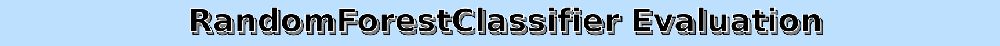

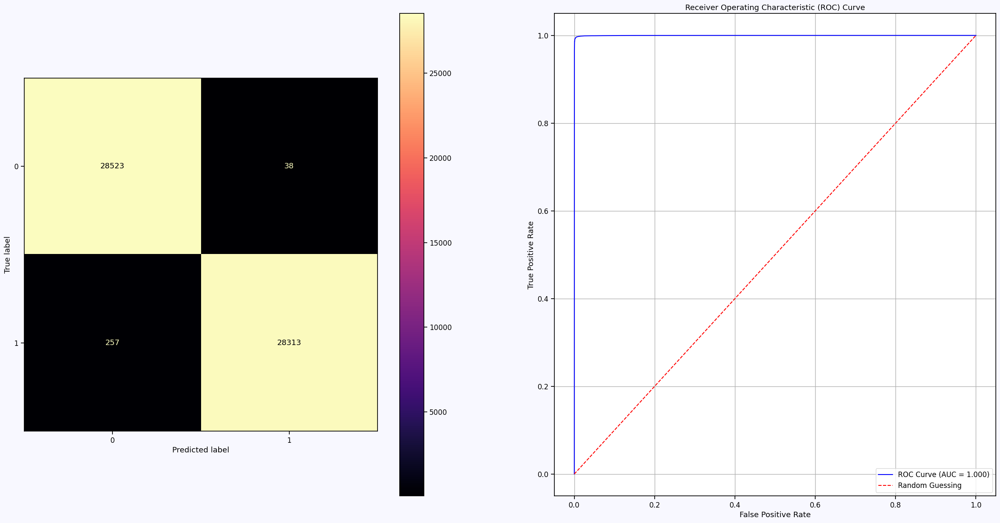

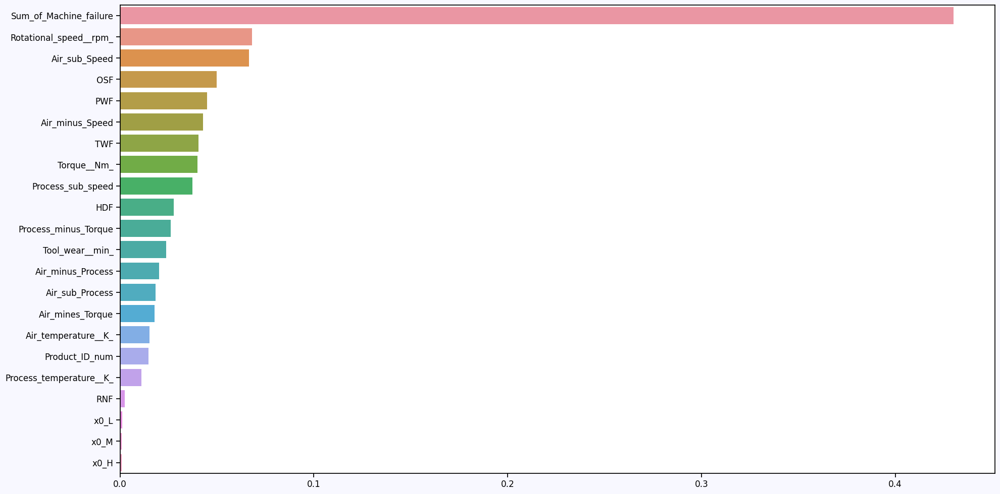

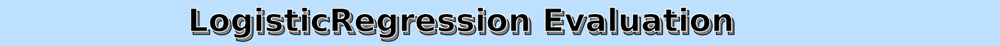

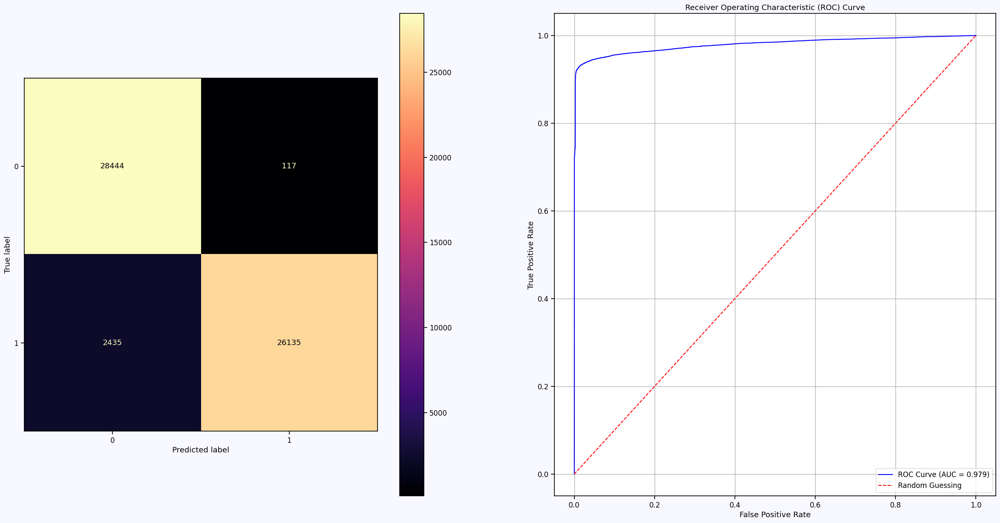

...

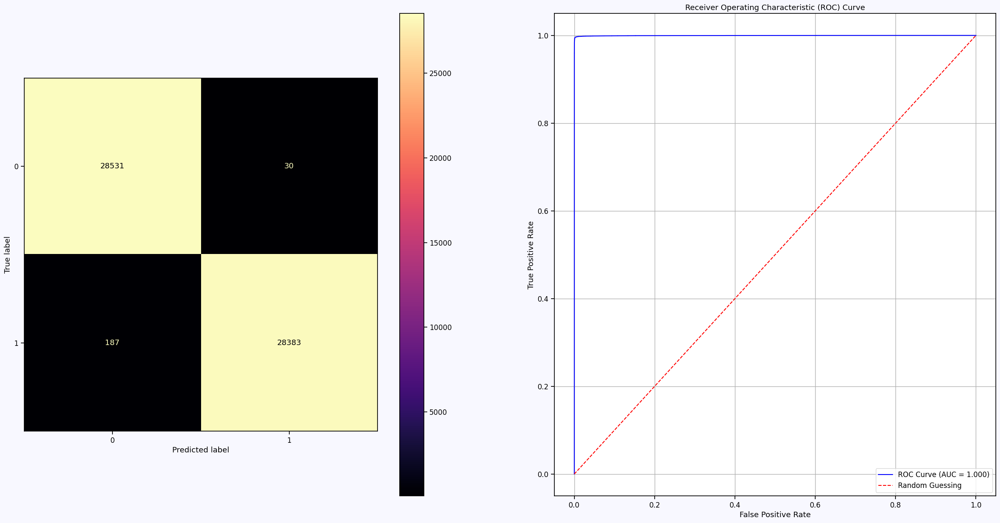

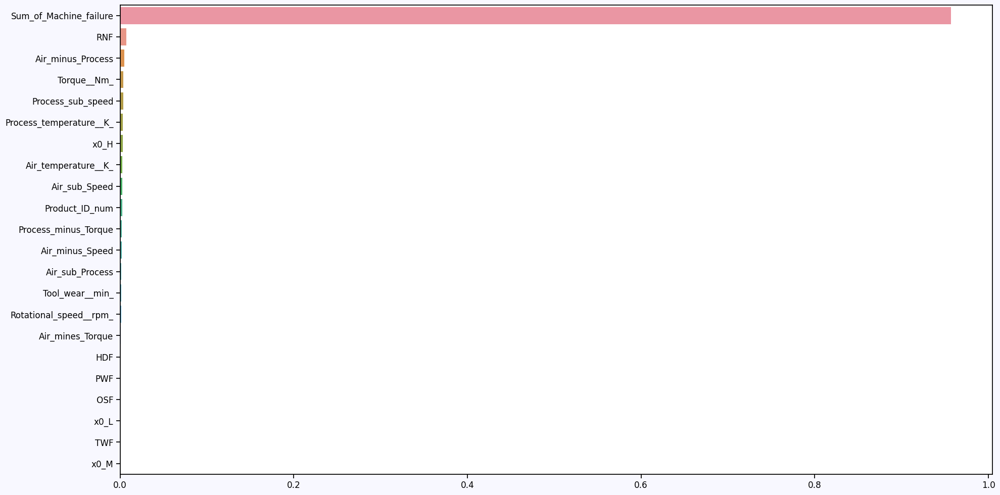

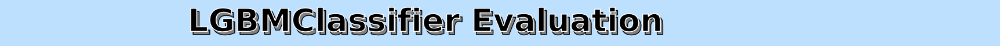

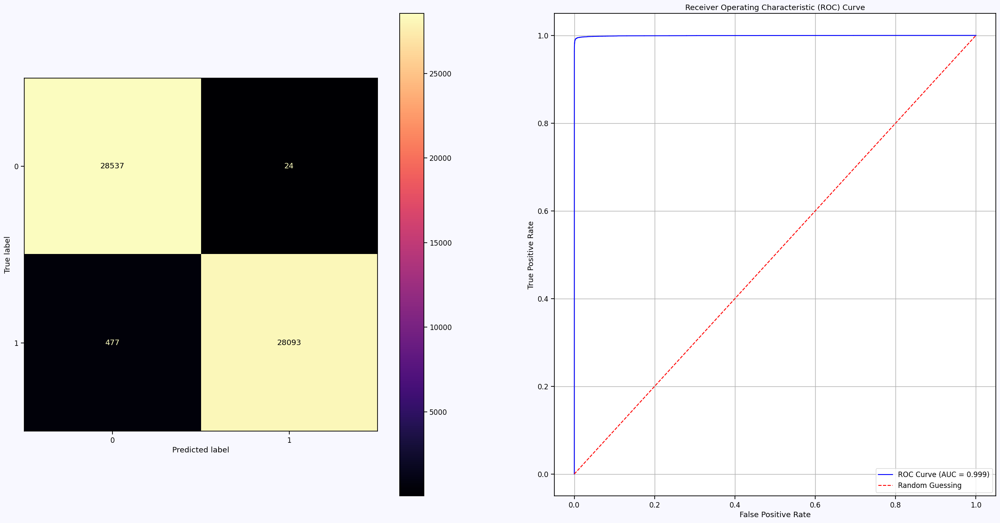

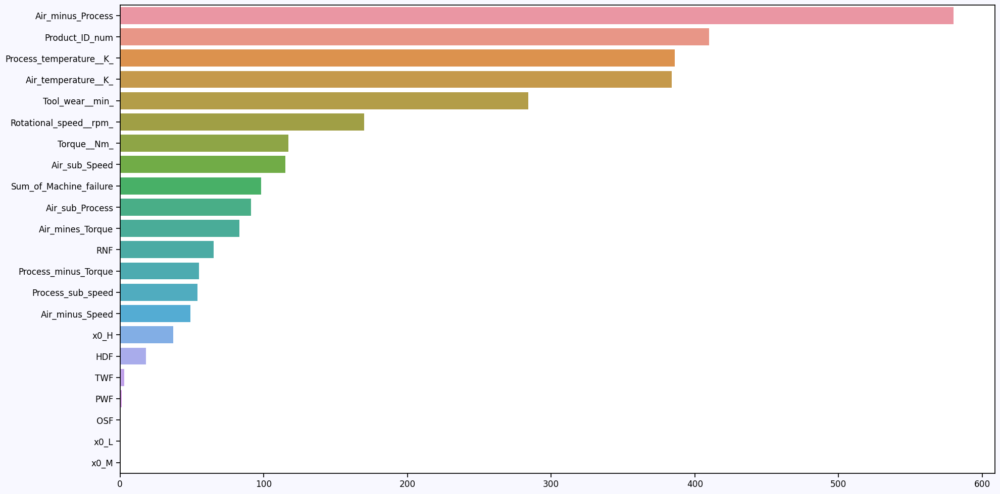

In [58]:
from sklearn.metrics import ConfusionMatrixDisplay,confusion_matrix
for i in range(len(list(model_dict))):
    
    label_txt(f'   {list(model_dict)[i]} Evaluation',w = 0.15)

    fig, axes = plt.subplots(1, 2, figsize = (30, 15),dpi = 100)
    
    sns.set_context('notebook',font_scale= 1.1)
    plt.rcParams['figure.facecolor'] = 'ghostwhite'
    plt.rcParams['axes.facecolor'] = 'white'
    g = ConfusionMatrixDisplay(confusion_matrix(y_test,model_ypred[i])).plot(cmap='magma',ax = axes[0])

    fpr, tpr, thresholds = roc_curve(y_test,model_ypred_prop[i])
    auc_score = roc_auc_score(y_test,model_ypred_prop[i])


    axes[1].plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.3f})', color='b')
    axes[1].plot([0, 1], [0, 1], '--', color='red', label='Random Guessing')

    axes[1].set_xlabel('False Positive Rate')
    axes[1].set_ylabel('True Positive Rate')

    axes[1].set_title('Receiver Operating Characteristic (ROC) Curve')
    axes[1].legend(loc='lower right')
    axes[1].grid(True)
    axes[1].patch.set_linewidth(10)
    if list(model_dict)[i] in ['BaggingClassifier','LogisticRegression','HistGradientBoostingClassifier']:
        continue
        
        
    plt.figure(figsize=(20,10))

    sns.barplot(y =X_train.columns, x =  model_dict[list(model_dict)[i]].feature_importances_, 
            order=X_train.columns[np.argsort(-model_dict[list(model_dict)[i]].feature_importances_)])

    plt.tight_layout()

In [81]:
from xgboost import XGBClassifier# XGBoost

params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }



xgb = XGBClassifier(
learning_rate=0.01, n_estimators=700, objective='binary:logistic',
                    silent=False, nthread=11
)




In [82]:
xgb.fit(X_train,y_train)

[08:50:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 

Parameters: { "silent" } are not used.




XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=700, n_jobs=None, nthread=11, num_parallel_tree=None,
              predictor=None, ...)

In [ ]:
sub = {'id':df_test['id'],
    'Machine failure':y_pred
    

}
sub_df = pd.DataFrame(sub)
sub_df

sub_df.to_csv('sub_new_3_new.csv',index = False)


In [83]:
y_pred_prop=xgb.predict_proba(X_test)[:,1] 
y_pred=xgb.predict(X_test)



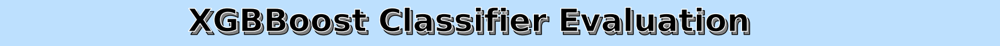

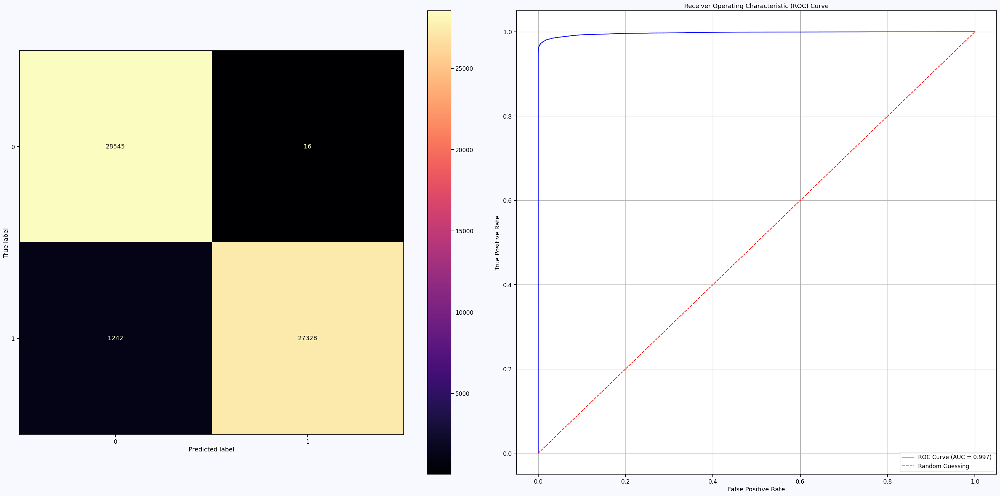

In [84]:
label_txt(f'   XGBBoost Classifier Evaluation',w = 0.15)

fig, axes = plt.subplots(1, 2, figsize = (30, 15),dpi = 100)

sns.set_context('notebook',font_scale= 1.1)
plt.rcParams['figure.facecolor'] = 'ghostwhite'
plt.rcParams['axes.facecolor'] = 'white'
g = ConfusionMatrixDisplay(confusion_matrix(y_test,y_pred)).plot(cmap='magma',ax = axes[0])

fpr, tpr, thresholds = roc_curve(y_test,y_pred_prop)
auc_score = roc_auc_score(y_test,y_pred_prop)


axes[1].plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.3f})', color='b')
axes[1].plot([0, 1], [0, 1], '--', color='red', label='Random Guessing')

axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')

axes[1].set_title('Receiver Operating Characteristic (ROC) Curve')
axes[1].legend(loc='lower right')
axes[1].grid(True)
axes[1].patch.set_linewidth(10)

plt.tight_layout()

In [86]:
from sklearn.metrics import accuracy_score
pred = []

for i in thresholds:
    y_pred_new = []
    for c in y_pred_prop:
        
        if c >= i:
            y_pred_new.append(1)
        else:
            y_pred_new.append(0)
    pred.append(accuracy_score(y_test,y_pred_new))

In [87]:
ROC_dict = {
    
    'fpr':fpr,
    'tpr':tpr,
    "thresholds":thresholds,
    'prediction':pred
    
}

In [88]:
ROC_df = pd.DataFrame(ROC_dict)
ROC_df

,fpr,tpr,thresholds,prediction
0,0.000000,0.000000,1.999497,0.499921
1,0.000000,0.802205,0.999497,0.901087
2,0.000000,0.813371,0.999495,0.906671
3,0.000000,0.819636,0.999488,0.909804
4,0.000000,0.819671,0.999488,0.909821
...,...,...,...,...
6609,0.999125,1.000000,0.003861,0.500516
6610,0.999265,1.000000,0.003858,0.500446
6611,0.999510,1.000000,0.003537,0.500324
6612,0.999930,1.000000,0.003285,0.500114


In [89]:
ROC_df.sort_values('prediction',ascending=False)

,fpr,tpr,thresholds,prediction
625,0.006302,0.972979,0.284612,0.983337
621,0.006197,0.972804,0.286223,0.983302
624,0.006302,0.972909,0.284699,0.983302
627,0.006442,0.973014,0.282715,0.983284
626,0.006442,0.972979,0.282989,0.983267
...,...,...,...,...
6610,0.999265,1.000000,0.003858,0.500446
6611,0.999510,1.000000,0.003537,0.500324
6612,0.999930,1.000000,0.003285,0.500114
6613,1.000000,1.000000,0.003183,0.500079


In [90]:
xgb.fit(X_resampled,y_resampled)

[08:56:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 

Parameters: { "silent" } are not used.




XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=700, n_jobs=None, nthread=11, num_parallel_tree=None,
              predictor=None, ...)

In [95]:
y_pred = xgb.predict_proba(X_test_df)[:,1]
y_pred

array([0.0196413 , 0.01111445, 0.01495124, ..., 0.02782729, 0.01630444,
       0.00968185], dtype=float32)

In [96]:
sub = {'id':df_test['id'],
    'Machine failure':y_pred
    

}
sub_df = pd.DataFrame(sub)
sub_df

sub_df.to_csv('sub_new_3_new.csv',index = False)


In [105]:
from sklearn.base import TransformerMixin, BaseEstimator
class New_Features(BaseEstimator, TransformerMixin):

    def __init__(self, string=5):
        self.string = string
    
    def fit(self, X, y=None):
        return self  
    
    def transform(self, X, y=None):
        df_heat = X.copy()
        df_heat['Sum of Machine failure'] = df_heat['TWF'] + df_heat['HDF'] + df_heat['PWF'] + df_heat['OSF'] + df_heat['RNF']

        df_heat['Air minus Speed'] = df_heat['Air temperature [K]'] - df_heat['Rotational speed [rpm]']
        df_heat['Air minus Process'] = df_heat['Air temperature [K]'] - df_heat['Process temperature [K]']
        df_heat['Air sub Process'] = df_heat['Air temperature [K]'] / df_heat['Process temperature [K]']
        df_heat['Air sub Speed'] = df_heat['Air temperature [K]'] / df_heat['Rotational speed [rpm]']
        df_heat['Air mines Torque'] = df_heat['Air temperature [K]'] - df_heat['Torque [Nm]']
        df_heat['Process minus Torque'] = df_heat['Process temperature [K]'] - df_heat['Torque [Nm]']
        df_heat['Process sub speed'] = df_heat['Process temperature [K]'] / df_heat['Rotational speed [rpm]']

        df_heat.columns = [re.sub(r"[^a-zA-Z0-9_]", "_", col) for col in df_heat.columns]
        self.string = df_heat.columns
        return df_heat
    def get_feature_names_out(self):
        return self.string
        

In [126]:
new_x_cat_train = New_Features().transform(df_train)
new_x_cat_train.drop(columns = ['Product_ID_num'],inplace = True)

In [137]:
train_ = new_x_cat_train.copy().reset_index(drop = True)
train

,Product_ID,Type,Air_temperature__K_,Process_temperature__K_,Rotational_speed__rpm_,Torque__Nm_,Tool_wear__min_,Machine_failure,TWF,HDF,...,OSF,RNF,Sum_of_Machine_failure,Air_minus_Speed,Air_minus_Process,Air_sub_Process,Air_sub_Speed,Air_mines_Torque,Process_minus_Torque,Process_sub_speed
0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,...,0,0,0,-1295.4,-9.0,0.970930,0.188346,264.5,273.5,0.193985
1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,...,0,0,0,-1456.4,-9.5,0.969561,0.172030,273.5,283.0,0.177430
2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,...,0,0,0,-1505.7,-9.2,0.970178,0.165817,272.8,282.0,0.170914
3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,...,0,0,0,-1223.0,-9.9,0.968157,0.197507,256.7,266.6,0.204003
4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,...,0,0,0,-1343.0,-11.0,0.964401,0.181597,262.6,273.6,0.188300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145309,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,...,0,0,0,-1305.2,-9.6,0.968872,0.186284,269.3,278.9,0.192269
145310,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,...,0,0,0,-1333.1,-9.5,0.969196,0.183150,267.1,276.6,0.188971
145311,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,...,0,0,0,-1346.0,-9.6,0.968892,0.181763,265.6,275.2,0.187599
145312,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,...,0,0,0,-1109.0,-9.7,0.968578,0.212358,250.5,260.2,0.219247


In [138]:
X = train.drop(columns = ['Machine_failure'])
y = train['Machine_failure']

In [139]:
new_x_cat_test = New_Features().transform(df_test)
new_x_cat_test.drop(columns = ['Product_ID_num'],inplace = True)

In [140]:
from catboost import Pool,CatBoostClassifier
from sklearn.model_selection import RepeatedKFold
train_pool = Pool(new_x_cat_train.to_numpy(), y.to_numpy(), feature_names=list(new_x_cat_train.columns), cat_features=['Product_ID', 'Type'])

In [141]:
cat_models_list  = []
skf = RepeatedKFold(n_repeats=2, n_splits=2)

In [142]:

scores = []

for train_index, val_index in skf.split(X, y):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]
    
    
    train_pool = Pool(X_train.to_numpy(), y_train.to_numpy(), feature_names=list(X.columns), cat_features=['Product_ID', 'Type'])
    eval_pool = Pool(X_val.to_numpy(), y_val.to_numpy(), feature_names=list(X.columns), cat_features=['Product_ID', 'Type'])
    
    cat_model = CatBoostClassifier()
    cat_model.fit(train_pool, eval_set=eval_pool, verbose = False)
    
    train_roc_auc_score = roc_auc_score(train["Machine_failure"], cat_model.predict(train.drop(columns=["Machine_failure"])))
    print(f"Train AUC Score : {train_roc_auc_score}")
    cat_models_list.append(cat_model)

Train AUC Score : 0.9037987600425911

Train AUC Score : 0.9020138562867646

Train AUC Score : 0.9044264015219877

Train AUC Score : 0.9011991723257227


In [160]:
test_predictions = []

test_pool = Pool(new_x_cat_test.to_numpy(), feature_names=list(new_x_cat_test.columns), cat_features=['Product_ID', 'Type'])

for model in models:
    
    preds = model.predict_proba(test_pool)[:, 1]
    test_predictions.append(preds)
    
test_predictions = np.array(test_predictions).mean(0)

In [163]:
test_predictions

array([0.00078266, 0.00070942, 0.00065438, ..., 0.00088579, 0.00321346,
       0.00081312])

In [166]:
sub = {'id':df_test['id'],
    'Machine failure':test_predictions
    

}
sub_df = pd.DataFrame(sub)
sub_df

sub_df.to_csv('final_sub.csv',index = False)
